# Project Overview

Early detection of plant diseases is critical for improving crop yield and reducing agricultural losses. 
Manual inspection of plant leaves is time-consuming, labor-intensive, and prone to human error. 

In this project, We       explore **deep learning-based image classification** approaches for automatic plant disease recognition.
We       classify plant leaf images into three categories:
- **Healthy**
- **Powdery**
- **Rust**

We       systematically study:
1. Dataset characteristics through Exploratory Data Analysis (EDA)
2. Custom CNN models trained from scratch
3. Transfer learning using pretrained deep architectures
4. Fine-tuning strategies for improved generalization


# Set the Data path 

In this cell, We      set the project and dataset paths that will be used throughout the notebook. This makes the notebook easier to run  all later code can refer to the same `PROJECT_ROOT` and `DATA_ROOT` variables instead of hardcoding paths multiple times.


In [1]:
import sys
from pathlib import Path

PROJECT_ROOT = Path().resolve()          
sys.path.append(str(PROJECT_ROOT / "src"))

DATA_ROOT = PROJECT_ROOT / "data" / "plant-disease-recognition-dataset"
print("PROJECT_ROOT:", PROJECT_ROOT)
print("DATA_ROOT:", DATA_ROOT)
print("Exists?", DATA_ROOT.exists())


PROJECT_ROOT: C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project
DATA_ROOT: C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project\data\plant-disease-recognition-dataset
Exists? True


In this cell, We      prepare the notebook environment for the rest of the experiments. This includes adding the `src/` folder to the Python path so We      can import my project modules (data loader, utilities, and model experiment classes). We      also reload modules when needed so the notebook always runs the latest version of my code without restarting the kernel.


In [2]:


from data_eda import DataConfig, PlantDiseaseDataModule

dm = PlantDiseaseDataModule(DataConfig(data_root=str(DATA_ROOT)))

df = dm.build_dataframe()
print("Scanned images:", len(df))
print("Classes:", dm.class_names)


Total images found: 1532
Scanned images: 1532
Classes: ['Healthy', 'Powdery', 'Rust']


# EDA

In this cell, We      run the exploratory data analysis (EDA) part of the project. The goal here is to understand the dataset structure, confirm the class labels, and check how the images look in real conditions (background clutter, lighting changes, and symptom visibility). This step helps us justify modeling decisions later, like why augmentation is needed and why transfer learning is a good choice for a small dataset.


========== Imports & basic setup (base_dir contents) ==========
Base directory: C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project\data\plant-disease-recognition-dataset
Contents:
   Test | Dir: True
   Train | Dir: True
   Validation | Dir: True

========== Inspect directory structure and classes ==========

=== Train/Train ===
Path: C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project\data\plant-disease-recognition-dataset\Train\Train
Classes: ['Healthy', 'Powdery', 'Rust']

=== Test/Test ===
Path: C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project\data\plant-disease-recognition-dataset\Test\Test
Classes: ['Healthy', 'Powdery', 'Rust']

=== Validation/Validation ===
Path: C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project\data\plant-disease-recognition-dataset\V

,split,label,filepath,filename,filesize_kb
0,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,800edef467d27c15.jpg,1065.934570
1,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,801d6dcd96e48ebc.jpg,685.217773
2,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,802b59956a7aa5e7.jpg,1170.898438
3,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,803bcb65f486e39a.jpg,684.755859
4,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,803e60cf3c64e1fe.jpg,922.815430
5,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,804e1eda54919fbb.jpg,1142.842773
6,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,804e673e9ec3d12b.jpg,1247.210938
7,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,809e3fc0cbac7c59.jpg,715.629883
8,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,80a13fcd9a4fb14b.jpg,1014.493164
9,Train/Train,Healthy,C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE ...,80a2c93fd2d9655d.jpg,701.685547



==========  Class balance per split ==========


label,Healthy,Powdery,Rust
split,,,
Test/Test,50,50,50
Train/Train,458,430,434
Validation/Validation,20,20,20


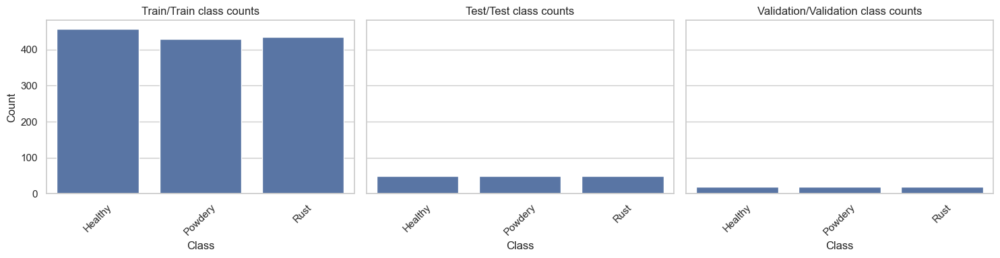


========== Image mode/width/height + corrupt check ==========
Unique image modes:
mode
RGB    1532
Name: count, dtype: int64

Number of corrupt/unreadable files: 0

==========  Shape statistics & aspect ratio per split ==========


,width,height
count,1532.00,1532.00
mean,3986.06,2702.45
std,521.64,385.26
min,2421.00,1728.00
25%,4000.00,2672.00
50%,4000.00,2672.00
75%,4000.00,2672.00
max,5184.00,3456.00


width  height
4000   2672      1130
2592   1728       127
5184   3456        97
4000   3000        88
4608   3456        72
4032   3024        16
3901   2607         1
2421   2279         1
dtype: int64

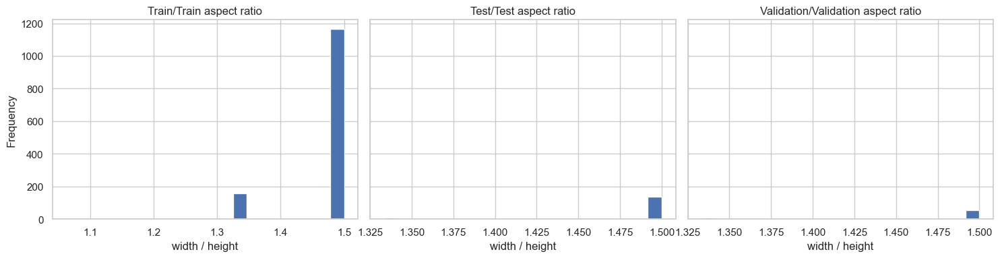


==========  File size distribution ==========


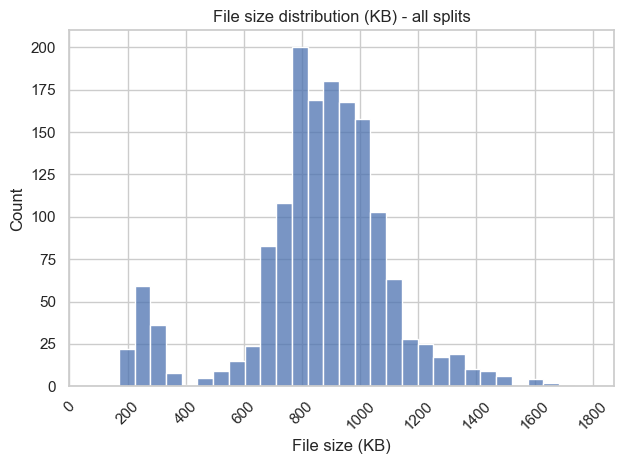

File size stats (KB):


count    1532.00
mean      862.61
std       247.43
min       170.35
25%       770.27
50%       879.09
75%      1001.43
max      1791.92
Name: filesize_kb, dtype: float64


========== Color & brightness statistics (sample) ==========


,split,label,mean_r,mean_g,mean_b,std_r,std_g,std_b,brightness
0,Train/Train,Rust,0.313575,0.494768,0.335133,0.172586,0.115733,0.172144,0.380818
1,Train/Train,Healthy,0.463429,0.602993,0.377604,0.198128,0.169322,0.175725,0.486318
2,Train/Train,Healthy,0.483284,0.590737,0.263147,0.197538,0.183318,0.203829,0.447047
3,Train/Train,Powdery,0.509733,0.599836,0.374791,0.158969,0.128782,0.160439,0.498068
4,Train/Train,Powdery,0.532835,0.599246,0.434593,0.152284,0.124887,0.173966,0.520370
5,Test/Test,Healthy,0.347642,0.499744,0.377993,0.187501,0.174701,0.173244,0.404245
6,Train/Train,Powdery,0.511648,0.555892,0.423105,0.154261,0.142220,0.178424,0.492777
7,Validation/Validation,Powdery,0.547894,0.606193,0.458855,0.148600,0.152792,0.168639,0.538677
8,Train/Train,Rust,0.494564,0.584574,0.318044,0.158592,0.125346,0.156643,0.465336
9,Test/Test,Powdery,0.479051,0.596600,0.525249,0.130126,0.112731,0.127938,0.534645



========== Brightness & mean RGB boxplots ==========


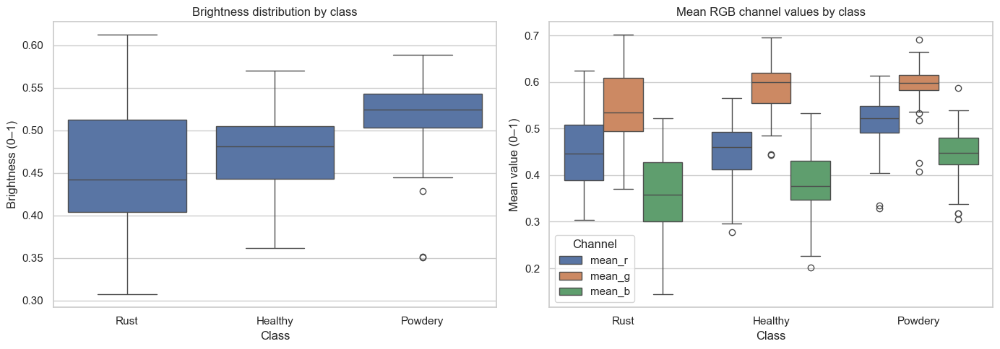


========== Duplicate detection (MD5) ==========
Number of exact duplicate pairs found: 0

==========  Visual  check - RAW samples BEFORE preprocessing ==========

=== Train/Train samples ===


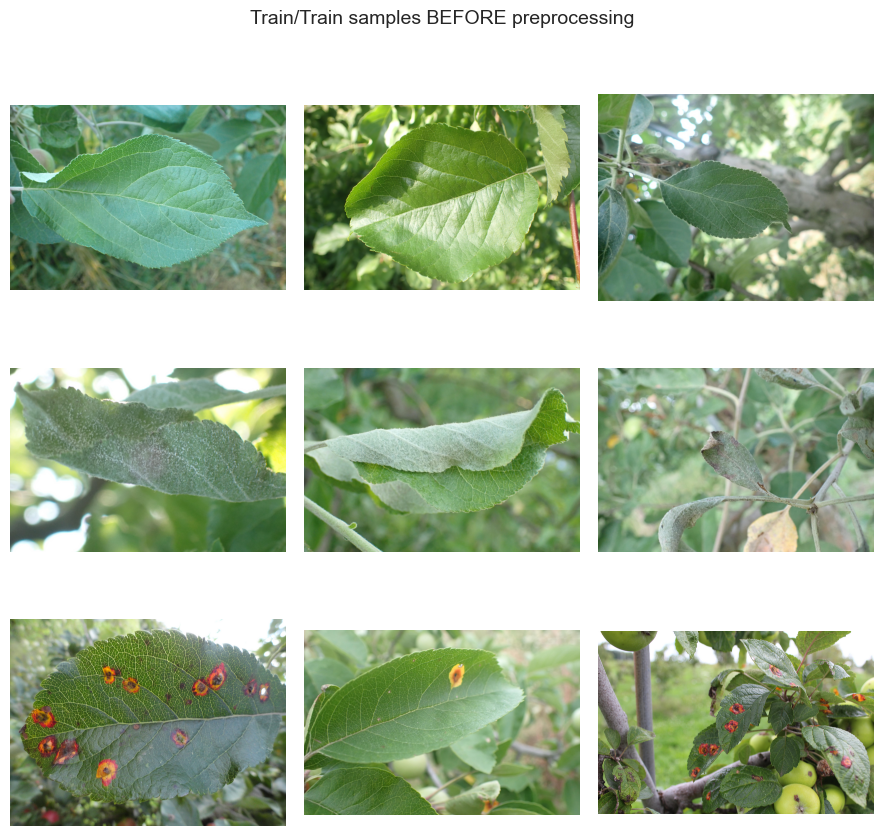


=== Test/Test samples ===


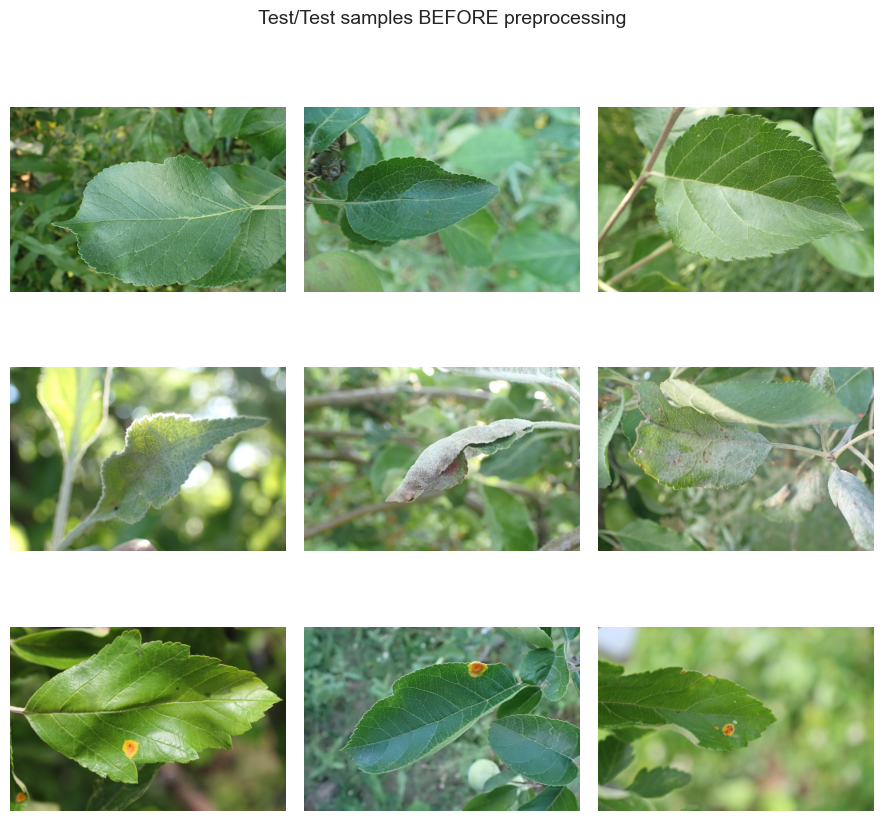


=== Validation/Validation samples ===


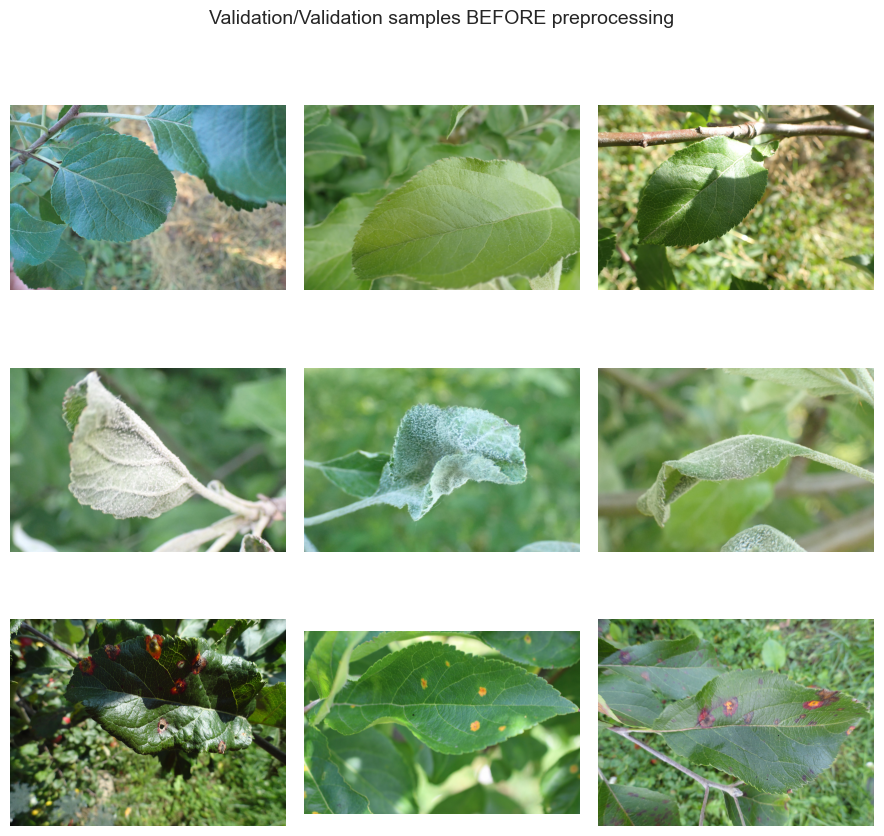


 Done with EDA!!!


In [3]:
# =========================
# EDA 
# =========================

from IPython.display import display

print("========== Imports & basic setup (base_dir contents) ==========")
dm.print_base_dir_contents()

print("\n========== Inspect directory structure and classes ==========")
dm.inspect_splits_and_classes()

print("\n========== Build dataframe of all images with metadata ==========")
df = dm.build_dataframe()
display(df.head(10))

print("\n==========  Class balance per split ==========")
display(dm.class_balance_table())
dm.plot_class_balance_per_split()

print("\n========== Image mode/width/height + corrupt check ==========")
df2, corrupt_files = dm.add_image_shape_and_mode()

print("\n==========  Shape statistics & aspect ratio per split ==========")
display(dm.shape_stats())
display(dm.top_shape_counts(top_n=10))
dm.plot_aspect_ratio_hist_per_split(bins=20)

print("\n==========  File size distribution ==========")
dm.plot_filesize_distribution(bins=30, tick_step_kb=200)

print("\n========== Color & brightness statistics (sample) ==========")
color_df = dm.compute_color_brightness_df(sample_n=300)
display(color_df.head(20))

print("\n========== Brightness & mean RGB boxplots ==========")
dm.plot_brightness_and_rgb_boxplots(color_df)

print("\n========== Duplicate detection (MD5) ==========")
dups = dm.find_exact_duplicates_md5()
print("Number of exact duplicate pairs found:", len(dups))
if dups:
    dup_df = pd.DataFrame(dups, columns=["filepath_1", "filepath_2"])
    display(dup_df.head())

print("\n==========  Visual  check - RAW samples BEFORE preprocessing ==========")
for split in dm.splits:
    print(f"\n=== {split} samples ===")
    dm.show_samples_before_preprocessing(split, samples_per_class=3)

print("\n Done with EDA!!!")


## Baseline CNN Model
In this cell, We      run the baseline scratch CNN experiment using 128×128 resized images. We      create the train/validation/test datasets using the same pipeline and augmentation settings used across the notebook to keep comparisons fair. Then We      train the baseline CNN (or load the saved model and history if retraining is disabled). This model acts as the first reference point to compare against improved CNNs and pretrained transfer learning models.


[baseline_cnn_final] Training...
Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 594ms/step - accuracy: 0.4482 - loss: 1.1920
Epoch 1: val_accuracy improved from None to 0.53333, saving model to models\baseline_cnn_final\baseline_cnn_final.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 30s 638ms/step - accuracy: 0.5204 - loss: 1.0173 - val_accuracy: 0.5333 - val_loss: 0.9538 - learning_rate: 0.0010
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 744ms/step - accuracy: 0.6465 - loss: 0.7482
Epoch 2: val_accuracy improved from 0.53333 to 0.61667, saving model to models\baseline_cnn_final\baseline_cnn_final.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 33s 790ms/step - accuracy: 0.6475 - loss: 0.7379 - val_accuracy: 0.6167 - val_loss: 0.6966 - learning_rate: 0.0010
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 744ms/step - accuracy: 0.6791 - loss: 0.7007
Epoch 3: val_accuracy improved from 0.61667 to 0.68333, saving model to models\baseline_cnn_final\baseline_cnn_final.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 34s 793ms/step - accuracy: 0.714

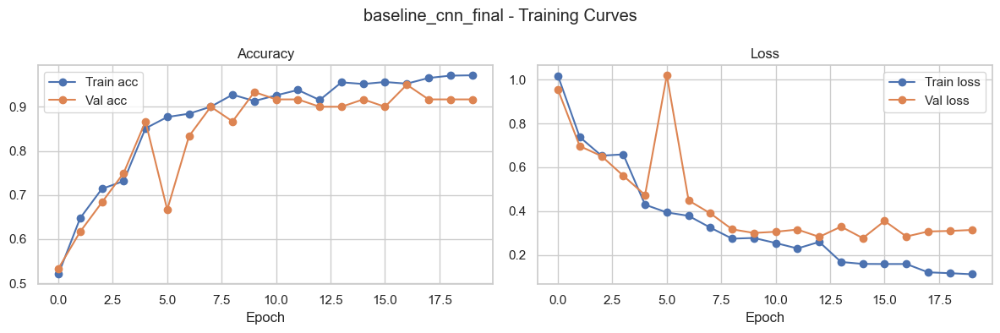


=== baseline_cnn_final ===
Test loss: 0.1975 | Test acc: 0.9467

              precision    recall  f1-score   support

     Healthy     0.8750    0.9800    0.9245        50
     Powdery     0.9783    0.9000    0.9375        50
        Rust     1.0000    0.9600    0.9796        50

    accuracy                         0.9467       150
   macro avg     0.9511    0.9467    0.9472       150
weighted avg     0.9511    0.9467    0.9472       150



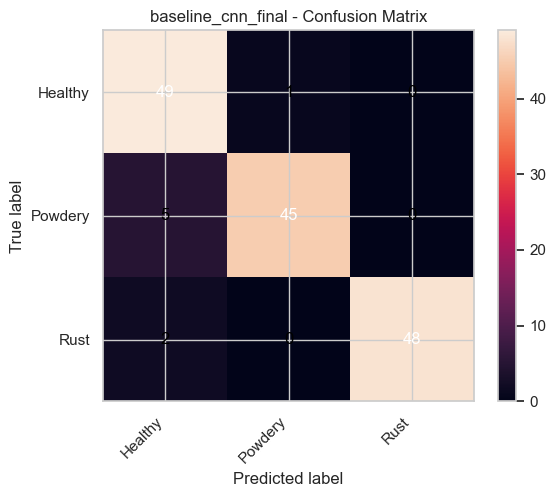

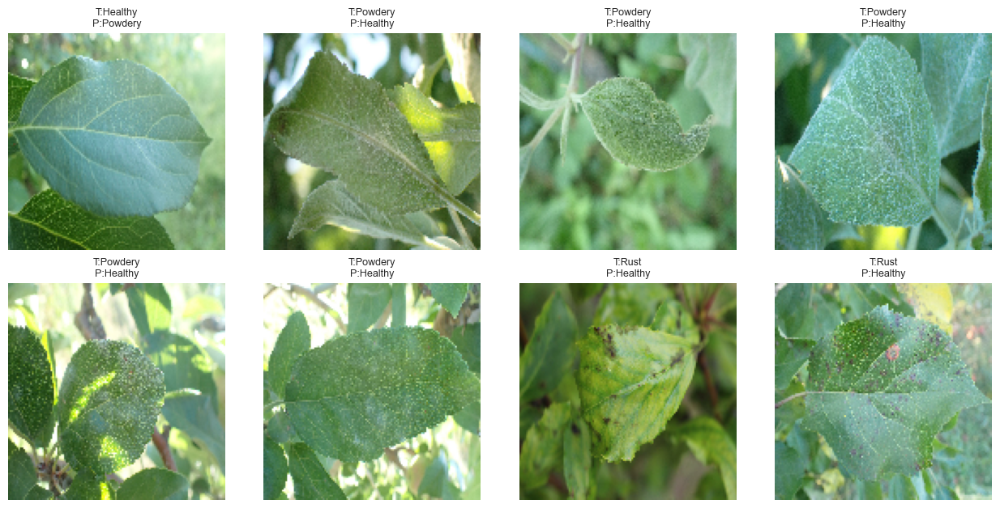

(0.19753581285476685, 0.9466666579246521)

In [ ]:
# =========================
# BASELINE CNN @128
# =========================

import importlib
import data_eda, utils, baseline_cnn
importlib.reload(data_eda)
importlib.reload(utils)
importlib.reload(baseline_cnn)

from baseline_cnn import BaselineConfig, BaselineCNNExperiment


train_ds = dm.build_tf_dataset("Train/Train", augment=True,  shuffle=True)
val_ds   = dm.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds  = dm.build_tf_dataset("Test/Test", augment=False, shuffle=False)

baseline = BaselineCNNExperiment(
    dm,
    BaselineConfig(
        model_root="models",
        experiment_name="baseline_cnn_128",
        model_filename="baseline_cnn_128.keras",  
        epochs=20,
        lr=1e-3,
        retrain=False,          # load if exists
        use_reduce_lr=True     
    )
)

baseline.train_or_load(train_ds, val_ds)
baseline.plot_curves()
baseline.evaluate_test(test_ds)


In [8]:
import importlib
importlib.reload(utils)

<module 'utils' from 'C:\\Users\\aprav\\OneDrive - Umich\\Fall 2025\\ECE 5831 Pattern Reg & Neural Networks\\ece5831-2025-final-project\\src\\utils.py'>


=== baseline_cnn_final ===
Test loss: 0.1975 | Test acc: 0.9467

              precision    recall  f1-score   support

     Healthy     0.8750    0.9800    0.9245        50
     Powdery     0.9783    0.9000    0.9375        50
        Rust     1.0000    0.9600    0.9796        50

    accuracy                         0.9467       150
   macro avg     0.9511    0.9467    0.9472       150
weighted avg     0.9511    0.9467    0.9472       150



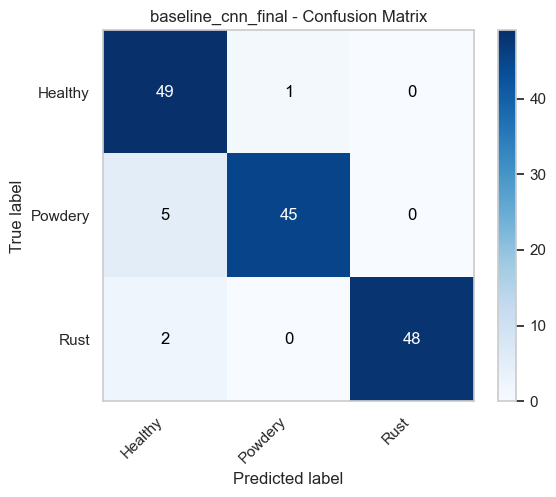

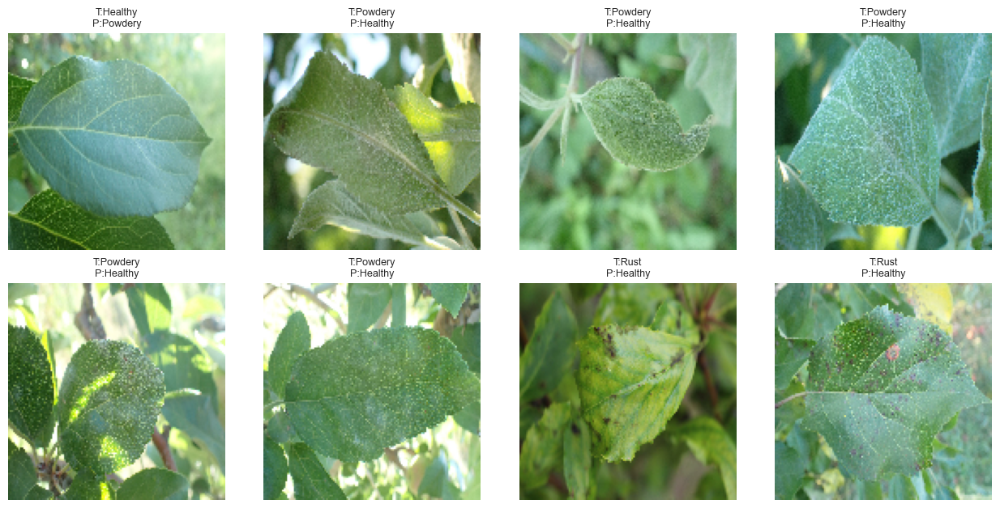

(0.19753581285476685, 0.9466666579246521)

In [9]:
baseline.evaluate_test(test_ds)

# Baseline CNN with input size 224

In this cell, We      run the same baseline CNN experiment but using 224×224 resized images. The purpose is to check whether higher input resolution helps the scratch CNN capture more disease detail (like small spots or texture changes). We      keep the training pipeline consistent so that the difference We      observe is mainly due to the input resolution and model behavior.


Total images found: 1532
[baseline_cnn_224] Training...
Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3686 - loss: 2.5697
Epoch 1: val_accuracy improved from None to 0.63333, saving model to models\baseline_cnn_224\baseline_cnn_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.4077 - loss: 1.5252 - val_accuracy: 0.6333 - val_loss: 0.8716 - learning_rate: 0.0010
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6286 - loss: 0.7821
Epoch 2: val_accuracy improved from 0.63333 to 0.73333, saving model to models\baseline_cnn_224\baseline_cnn_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.6823 - loss: 0.7015 - val_accuracy: 0.7333 - val_loss: 0.5679 - learning_rate: 0.0010
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8019 - loss: 0.5185
Epoch 3: val_accuracy improved from 0.73333 to 0.75000, saving model to models\baseline_cnn_224\baseline_cnn_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.8396 - lo

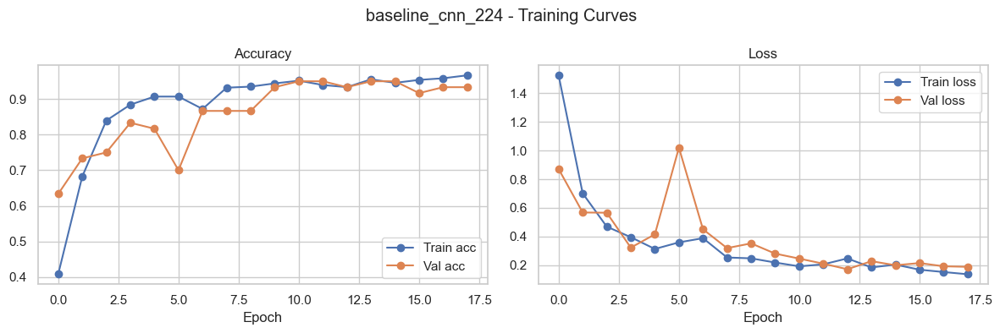


=== baseline_cnn_224 ===
Test loss: 0.2588 | Test acc: 0.9267

              precision    recall  f1-score   support

     Healthy     0.8421    0.9600    0.8972        50
     Powdery     0.9778    0.8800    0.9263        50
        Rust     0.9792    0.9400    0.9592        50

    accuracy                         0.9267       150
   macro avg     0.9330    0.9267    0.9276       150
weighted avg     0.9330    0.9267    0.9276       150



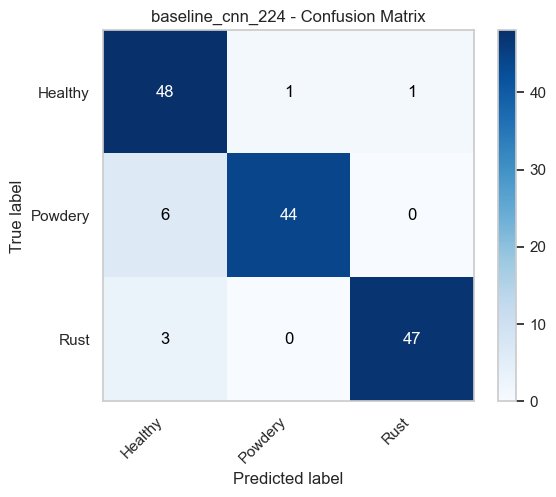

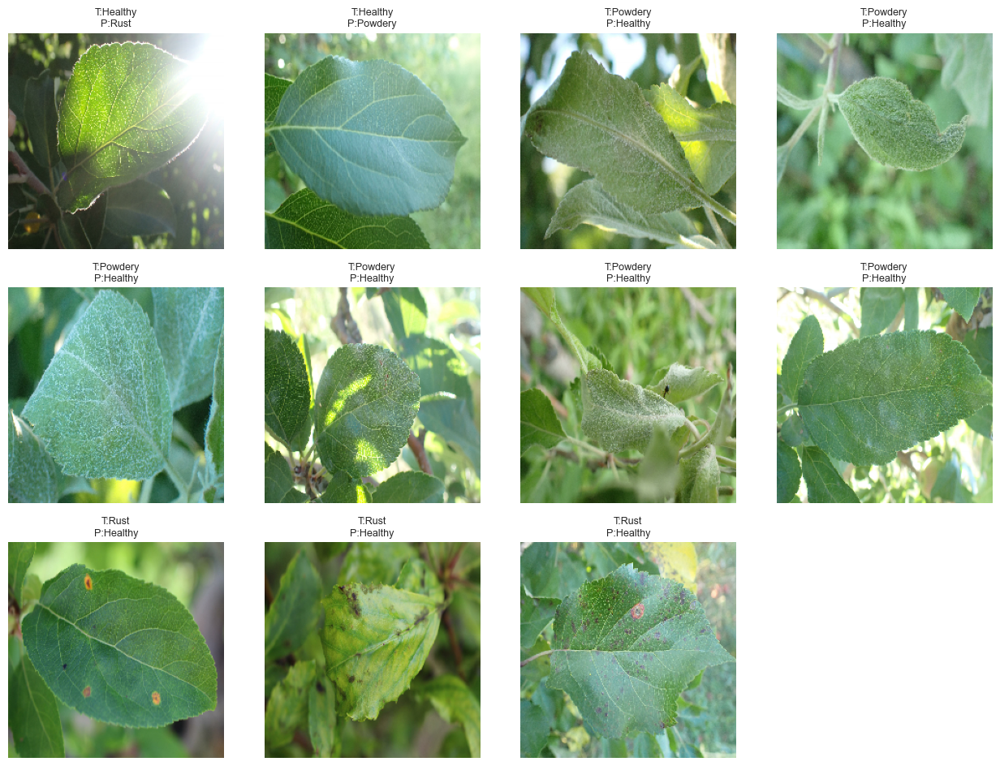

(0.2588231861591339, 0.9266666769981384)

In [ ]:
# =========================
# BASELINE CNN @224 ( for fair comparision with pretrained models)
# =========================
import importlib
import utils, data_eda, baseline_cnn
importlib.reload(utils)
importlib.reload(data_eda)
importlib.reload(baseline_cnn)

from data_eda import DataConfig, PlantDiseaseDataModule
from baseline_cnn import BaselineConfig, BaselineCNNExperiment

# Build datamodule at 224x224
dm224 = PlantDiseaseDataModule(
    DataConfig(
        data_root=str(DATA_ROOT),
        img_size=(224, 224),
        batch_size=32,
        use_augmentation=True
    )
)
dm224.build_dataframe()

train_ds_224 = dm224.build_tf_dataset("Train/Train", augment=True,  shuffle=True)
val_ds_224   = dm224.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds_224  = dm224.build_tf_dataset("Test/Test", augment=False, shuffle=False)


baseline224 = BaselineCNNExperiment(
    dm224,
    BaselineConfig(
        model_root="models",
        experiment_name="baseline_cnn_224",
        model_filename="baseline_cnn_224.keras",
        epochs=20,
        lr=1e-3,
        retrain=True   # first time True; later set False to load
    )
)

baseline224.train_or_load(train_ds_224, val_ds_224)
baseline224.plot_curves()
baseline224.evaluate_test(test_ds_224)


# Improved CNN with 128 Image input

In this cell, We      run the improved scratch CNN experiment using 128×128 images. This model is designed as a stronger version of the baseline (for example, with more depth and training stabilization) while still being trained from scratch. The goal is to see whether architectural improvements reduce the common misclassifications seen in the baseline, especially betWe      en Healthy and Powdery.


[improved_cnn_ref] Training...


c:\Users\aprav\anaconda3\envs\ece-5831-2025\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - accuracy: 0.6430 - loss: 2.8885
Epoch 1: val_accuracy improved from None to 0.36667, saving model to models\improved_cnn_ref\improved_cnn_ref.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 45s 884ms/step - accuracy: 0.7300 - loss: 1.9245 - val_accuracy: 0.3667 - val_loss: 2.4792 - learning_rate: 0.0010
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 731ms/step - accuracy: 0.8394 - loss: 0.7494
Epoch 2: val_accuracy improved from 0.36667 to 0.58333, saving model to models\improved_cnn_ref\improved_cnn_ref.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 72s 769ms/step - accuracy: 0.8563 - loss: 0.6112 - val_accuracy: 0.5833 - val_loss: 2.2130 - learning_rate: 0.0010
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 830ms/step - accuracy: 0.8976 - loss: 0.3688
Epoch 3: val_accuracy did not improve from 0.58333
42/42 ━━━━━━━━━━━━━━━━━━━━ 37s 862ms/step - accuracy: 0.8896 - loss: 0.3883 - val_accuracy: 0.3333 - val_loss: 8.8645 - learning_rate: 0.0010
Epoch 4/50
42/42 ━━━━━━━━━━━━━

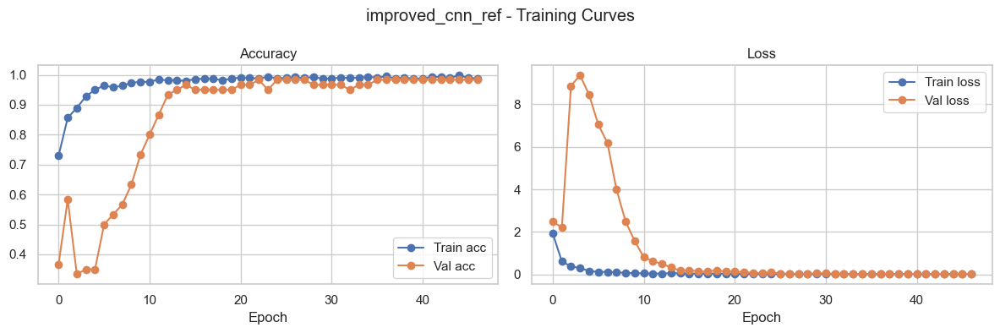


=== improved_cnn_ref ===
Test loss: 0.3053 | Test acc: 0.9467

              precision    recall  f1-score   support

     Healthy     0.9038    0.9400    0.9216        50
     Powdery     0.9787    0.9200    0.9485        50
        Rust     0.9608    0.9800    0.9703        50

    accuracy                         0.9467       150
   macro avg     0.9478    0.9467    0.9468       150
weighted avg     0.9478    0.9467    0.9468       150



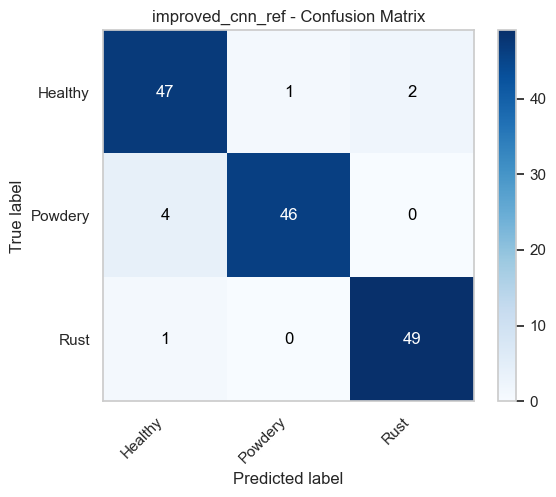

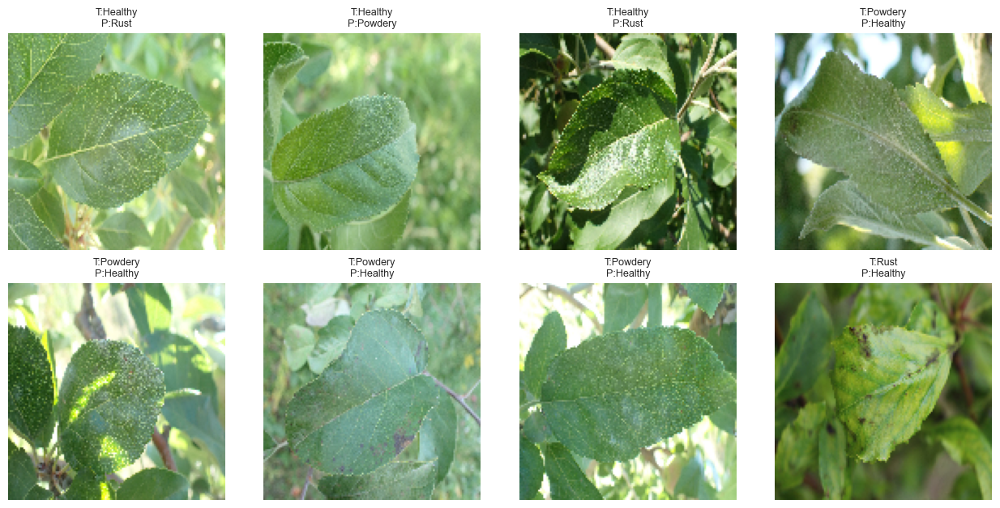

(0.3052852749824524, 0.9466666579246521)

In [ ]:
# =========================
# IMPROVED CNN 
# =========================
import importlib
import utils, improved_cnn_128
importlib.reload(utils)
importlib.reload(improved_cnn_128)

from improved_cnn_128 import ImprovedCNNConfig, ImprovedCNNExperiment

train_ds = dm.build_tf_dataset("Train/Train", augment=True,  shuffle=True)
val_ds   = dm.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds  = dm.build_tf_dataset("Test/Test", augment=False, shuffle=False)

improved = ImprovedCNNExperiment(
    dm,
    ImprovedCNNConfig(
        model_root="models",
        experiment_name="improved_cnn_128",
        epochs=50,
        lr=1e-3,
        retrain=False
    )
)

improved.train_or_load(train_ds, val_ds)
improved.plot_curves()
improved.evaluate_test(test_ds)



# Improved CNN with 224 Image input

In this cell, We      run the improved CNN experiment using 224×224 images and evaluate it on the test set. This lets me test whether the improved architecture benefits from higher resolution, or if the model still struggles due to limited data and real-world background clutter. The results here are useful to motivate why transfer learning is a better strategy than continuing to scale scratch CNNs.


Total images found: 1532
[improved_cnn_224] Training...
Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6405 - loss: 9.4473
Epoch 1: val_accuracy improved from None to 0.33333, saving model to models\improved_cnn_224\improved_cnn_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.7322 - loss: 5.1600 - val_accuracy: 0.3333 - val_loss: 20.2095 - learning_rate: 0.0010
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8351 - loss: 1.4349
Epoch 2: val_accuracy improved from 0.33333 to 0.46667, saving model to models\improved_cnn_224\improved_cnn_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.8427 - loss: 1.2993 - val_accuracy: 0.4667 - val_loss: 8.5452 - learning_rate: 0.0010
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8608 - loss: 0.9767
Epoch 3: val_accuracy did not improve from 0.46667
42/42 ━━━━━━━━━━━━━━━━━━━━ 76s 2s/step - accuracy: 0.8585 - loss: 0.8569 - val_accuracy: 0.3833 - val_loss: 9.8105 - learning_rate

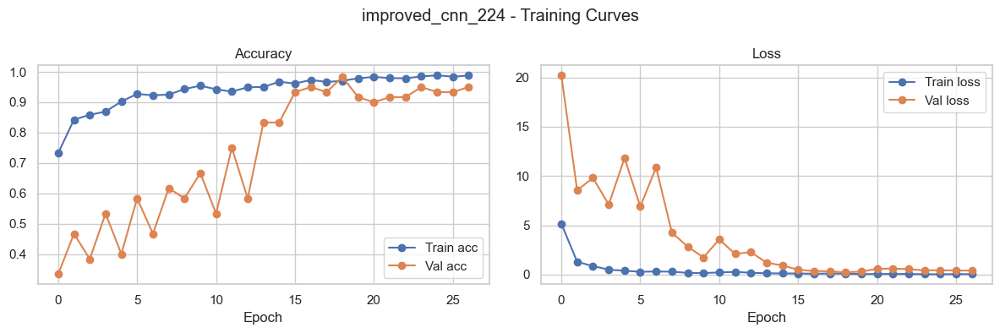


=== improved_cnn_224 ===
Test loss: 1.0080 | Test acc: 0.9133

              precision    recall  f1-score   support

     Healthy     0.7937    1.0000    0.8850        50
     Powdery     1.0000    0.8000    0.8889        50
        Rust     1.0000    0.9400    0.9691        50

    accuracy                         0.9133       150
   macro avg     0.9312    0.9133    0.9143       150
weighted avg     0.9312    0.9133    0.9143       150



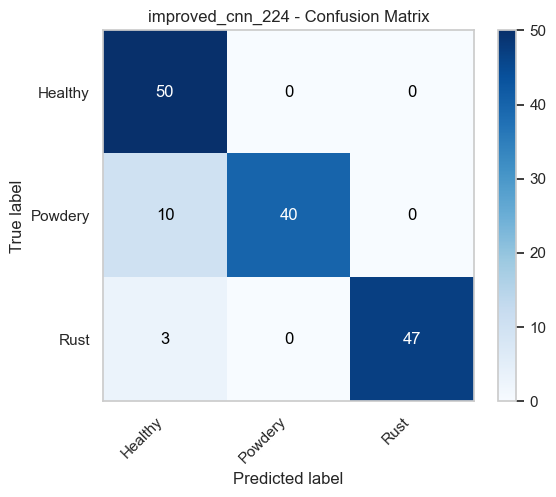

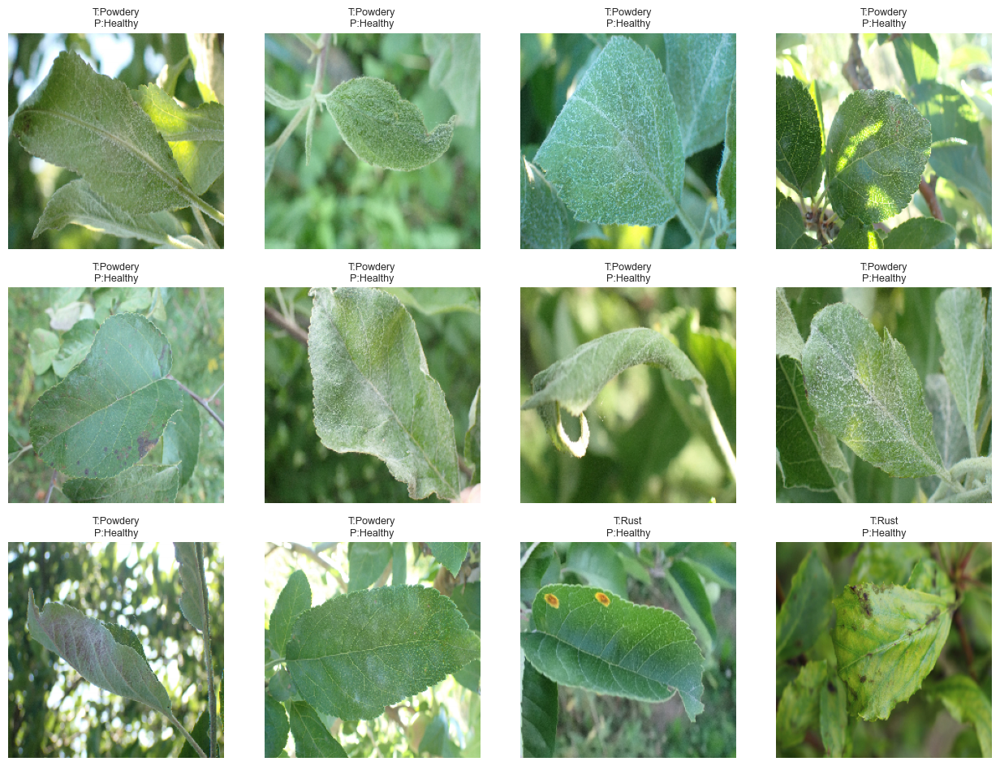

(1.007982850074768, 0.9133333563804626)

In [ ]:
# =========================
# IMPROVED CNN @224 
# =========================
import importlib
import data_eda, improved_cnn_224, utils
importlib.reload(data_eda)
importlib.reload(utils)
importlib.reload(improved_cnn_224)

from data_eda import DataConfig, PlantDiseaseDataModule
from improved_cnn_224 import ImprovedCNN224Config, ImprovedCNN224Experiment

dm224 = PlantDiseaseDataModule(
    DataConfig(
        data_root=str(DATA_ROOT),
        img_size=(224, 224),
        batch_size=32,
        use_augmentation=True
    )
)
dm224.build_dataframe()

train_ds_224 = dm224.build_tf_dataset("Train/Train", augment=True,  shuffle=True)
val_ds_224   = dm224.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds_224  = dm224.build_tf_dataset("Test/Test", augment=False, shuffle=False)

improved224 = ImprovedCNN224Experiment(
    dm224,
    ImprovedCNN224Config(
        model_root="models",
        experiment_name="improved_cnn_224",
        model_filename="improved_cnn_224.keras",
        epochs=50,
        lr=1e-3,
        retrain=True   
    )
)

improved224.train_or_load(train_ds_224, val_ds_224)
improved224.plot_curves()
improved224.evaluate_test(test_ds_224)


## Transfer Learning with Pretrained Models

Transfer learning use models pretrained on large-scale datasets such as ImageNet.
These models learn generic visual features (edges, textures, shapes) that transfer We      ll to new tasks.

We       evaluate:
- EfficientNetB0
- VGG16
- ResNet50

Initially, the pretrained backbone is frozen and only the classification head is trained.


#  EfficientNetB0 Transfer Learning (NO fine-tuning)

In this cell, We      run EfficientNetB0 transfer learning using a frozen backbone (feature extraction only). That means the pretrained EfficientNet layers stay fixed, and We      only train a small classification head on top for our three classes. This is a good baseline for transfer learning because it isolates how much benefit We       get from ImageNet-learned features without changing the backbone We      ights.


Total images found: 1532
[efficientnetb0_tl_224] Training (frozen backbone, no fine-tune)...
Epoch 1/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 924ms/step - accuracy: 0.7434 - loss: 0.5981
Epoch 1: val_loss improved from None to 0.05380, saving model to models\efficientnetb0_tl_224\efficientnetb0_tl_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 68s 1s/step - accuracy: 0.8601 - loss: 0.3644 - val_accuracy: 0.9667 - val_loss: 0.0538 - learning_rate: 0.0010
Epoch 2/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9360 - loss: 0.1639
Epoch 2: val_loss improved from 0.05380 to 0.04353, saving model to models\efficientnetb0_tl_224\efficientnetb0_tl_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - accuracy: 0.9539 - loss: 0.1394 - val_accuracy: 0.9833 - val_loss: 0.0435 - learning_rate: 0.0010
Epoch 3/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9624 - loss: 0.0984
Epoch 3: val_loss improved from 0.04353 to 0.02551, saving model to models\efficientnetb0_tl_224\efficientnetb0_tl_224.keras
42/42

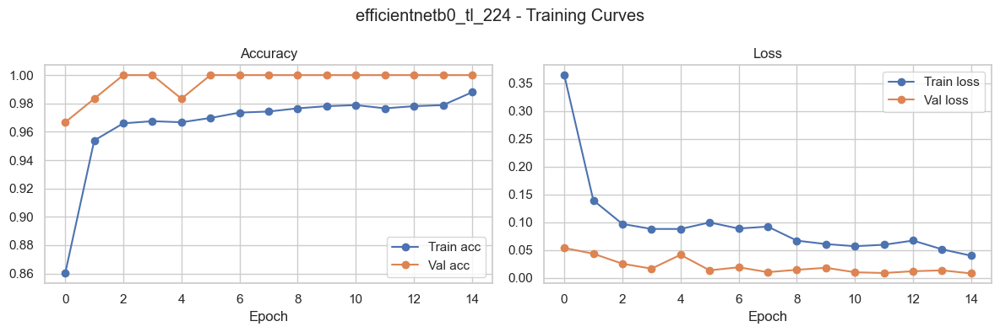


=== efficientnetb0_tl_224 ===
Test loss: 0.0811 | Test acc: 0.9733

              precision    recall  f1-score   support

     Healthy     0.9423    0.9800    0.9608        50
     Powdery     0.9792    0.9400    0.9592        50
        Rust     1.0000    1.0000    1.0000        50

    accuracy                         0.9733       150
   macro avg     0.9738    0.9733    0.9733       150
weighted avg     0.9738    0.9733    0.9733       150



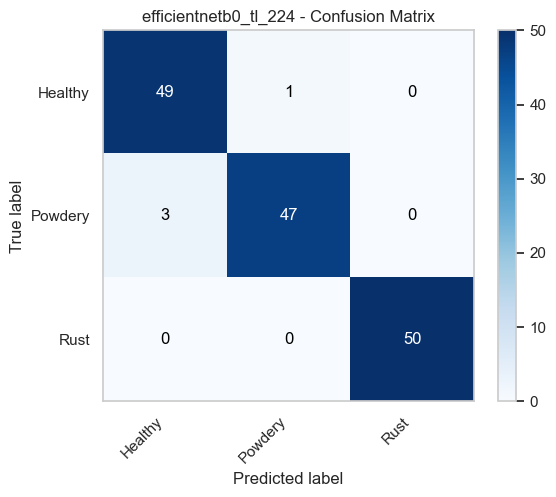

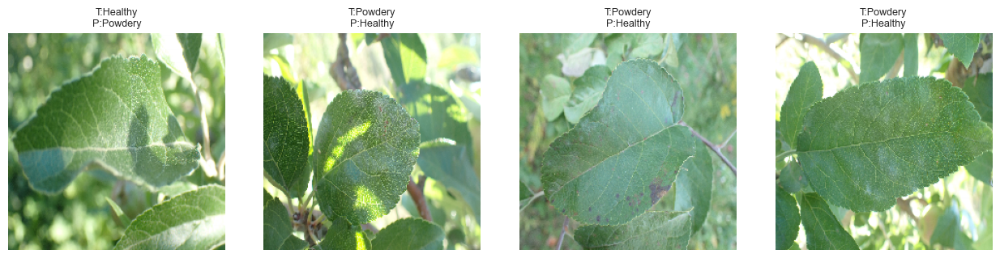

(0.08111409842967987, 0.9733333587646484)

In [ ]:
# =========================
# EfficientNetB0 Transfer Learning @224 (NO fine-tuning)
# =========================
import importlib
import utils, data_eda, pretrained_efficientnet_b0

importlib.reload(utils)
importlib.reload(data_eda)
importlib.reload(pretrained_efficientnet_b0)

from data_eda import DataConfig, PlantDiseaseDataModule
from pretrained_efficientnet_b0 import EfficientNetB0TLConfig, EfficientNetB0TransferLearningExperiment

dm224 = PlantDiseaseDataModule(
    DataConfig(
        data_root=str(DATA_ROOT),
        img_size=(224, 224),
        batch_size=32,
        use_augmentation=True
    )
)
dm224.build_dataframe()

train_ds_224 = dm224.build_tf_dataset("Train/Train", augment=True,  shuffle=True)
val_ds_224   = dm224.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds_224  = dm224.build_tf_dataset("Test/Test", augment=False, shuffle=False)

eff = EfficientNetB0TransferLearningExperiment(
    dm224,
    EfficientNetB0TLConfig(
        model_root="models",
        experiment_name="efficientnetb0_tl_224",
        model_filename="efficientnetb0_tl_224.keras",
        epochs=15,
        lr=1e-3,
        retrain=True   # set False to reload
    )
)

eff.train_or_load(train_ds_224, val_ds_224)
eff.plot_curves()
eff.evaluate_test(test_ds_224)


#  EfficientNetB0  (fine-tuning)

In this cell, We      fine-tune EfficientNetB0 starting from the saved frozen-backbone model. After the classifier head has learned the task, We      unfreeze only a small portion of the deeper layers and train with a very low learning rate. We      also keep BatchNorm layers frozen to reduce instability. The purpose is to adapt the pretrained features slightly to leaf textures and disease patterns while avoiding overfitting on a small dataset.


Total images found: 1532
[efficientnetb0_ft_224_last20_lr1e5] Fine-tuning from 'efficientnetb0_tl_224' (unfreeze_last_n=20, lr=1e-05)
[efficientnetb0_ft_224_last20_lr1e5] Base model path: models\efficientnetb0_tl_224\efficientnetb0_tl_224.keras
[efficientnetb0_ft_224_last20_lr1e5] Trainable layers after setup: 45/244
Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9854 - loss: 0.0425
Epoch 1: val_loss improved from None to 0.00576, saving model to models\efficientnetb0_ft_224_last20_lr1e5\efficientnetb0_ft_224_last20_lr1e5.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.9864 - loss: 0.0418 - val_accuracy: 1.0000 - val_loss: 0.0058 - learning_rate: 1.0000e-05
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9917 - loss: 0.0308
Epoch 2: val_loss did not improve from 0.00576

Epoch 2: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.
42/42 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.9871 - loss: 0.0401 - val_accuracy: 1.0000 - va

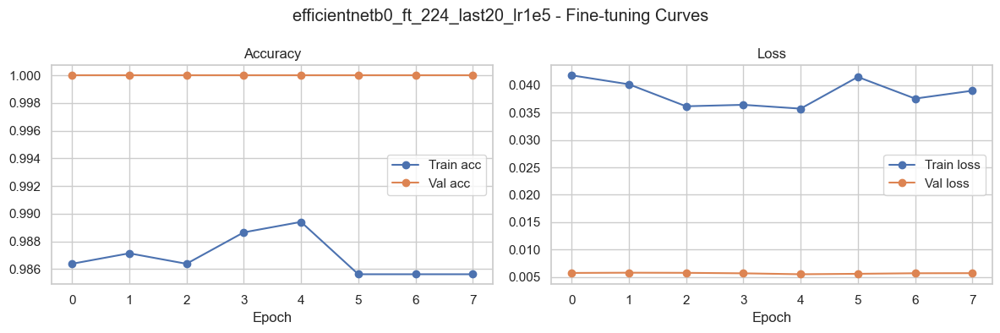


=== efficientnetb0_ft_224_last20_lr1e5 ===
Test loss: 0.0785 | Test acc: 0.9733

              precision    recall  f1-score   support

     Healthy     0.9423    0.9800    0.9608        50
     Powdery     0.9792    0.9400    0.9592        50
        Rust     1.0000    1.0000    1.0000        50

    accuracy                         0.9733       150
   macro avg     0.9738    0.9733    0.9733       150
weighted avg     0.9738    0.9733    0.9733       150



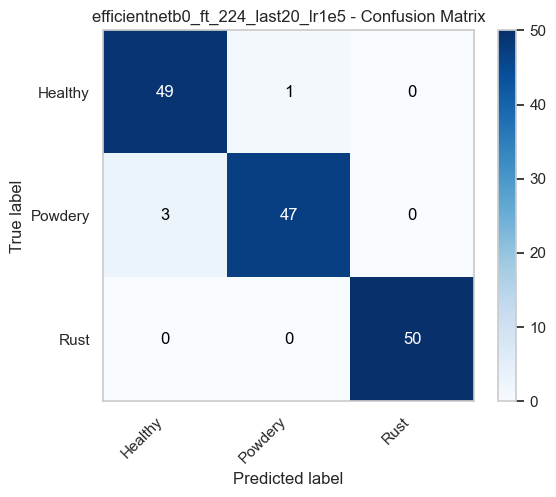

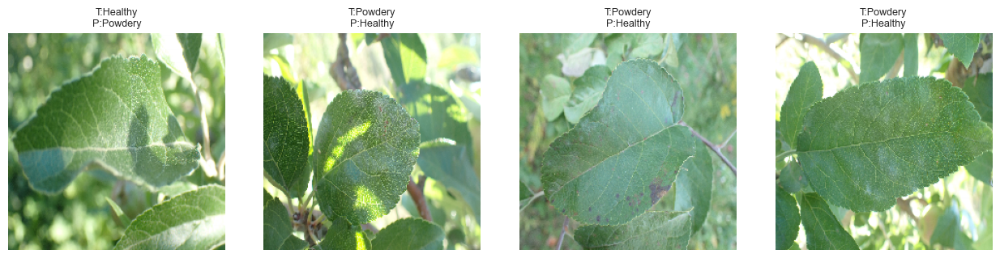

(0.07851169258356094, 0.9733333587646484)

In [ ]:
# =========================
# EfficientNetB0  Fine-tune 
# =========================
import os, sys, random, numpy as np, tensorflow as tf

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

PROJECT_ROOT = r"C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project"
SRC_DIR = os.path.join(PROJECT_ROOT, "src")
if SRC_DIR not in sys.path:
    sys.path.insert(0, SRC_DIR)

import importlib
import data_eda, utils, pretrained_efficientnet_b0_finetune
importlib.reload(data_eda)
importlib.reload(utils)
importlib.reload(pretrained_efficientnet_b0_finetune)

from data_eda import PlantDiseaseDataModule, DataConfig
from pretrained_efficientnet_b0_finetune import EfficientNetB0SafeFTConfig, EfficientNetB0SafeFineTuneExperiment

DATA_ROOT = os.path.join(PROJECT_ROOT, "data", "plant-disease-recognition-dataset")

dm224 = PlantDiseaseDataModule(DataConfig(
    data_root=DATA_ROOT,
    img_size=(224, 224),
    batch_size=32,
    use_augmentation=True
))
dm224.build_dataframe()

train_ds = dm224.build_tf_dataset("Train/Train", augment=True,  shuffle=True)
val_ds   = dm224.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds  = dm224.build_tf_dataset("Test/Test", augment=False, shuffle=False)


EXP_NAME = "efficientnetb0_ft_224_last20_lr1e5"
MODEL_FILE = f"{EXP_NAME}.keras"

exp = EfficientNetB0SafeFineTuneExperiment(
    dm224,
    EfficientNetB0SafeFTConfig(
        model_root="models",
        experiment_name=EXP_NAME,
        model_filename=MODEL_FILE,

        base_experiment_name="efficientnetb0_tl_224",
        base_model_filename="efficientnetb0_tl_224.keras",

        epochs=10,
        lr=1e-5,
        unfreeze_last_n=20,
        keep_batchnorm_frozen=True,
        retrain=True
    )
)

exp.train_or_load(train_ds, val_ds)
exp.plot_curves()
exp.evaluate_test(test_ds)


# Setup for next four models

In [5]:
import os, sys, random, numpy as np, tensorflow as tf

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

PROJECT_ROOT = r"C:\Users\aprav\OneDrive - Umich\Fall 2025\ECE 5831 Pattern Reg & Neural Networks\ece5831-2025-final-project"
SRC_DIR = os.path.join(PROJECT_ROOT, "src")
if SRC_DIR not in sys.path:
    sys.path.insert(0, SRC_DIR)

import importlib
import data_eda, utils
importlib.reload(data_eda)
importlib.reload(utils)

from data_eda import PlantDiseaseDataModule, DataConfig
DATA_ROOT = os.path.join(PROJECT_ROOT, "data", "plant-disease-recognition-dataset")

dm224 = PlantDiseaseDataModule(DataConfig(
    data_root=DATA_ROOT,
    img_size=(224, 224),
    batch_size=32,
    use_augmentation=True
))
dm224.build_dataframe()

train_ds = dm224.build_tf_dataset("Train/Train", augment=True, shuffle=True)
val_ds   = dm224.build_tf_dataset("Validation/Validation", augment=False, shuffle=False)
test_ds  = dm224.build_tf_dataset("Test/Test", augment=False, shuffle=False)




Total images found: 1532


# VGG pretrained / frozen

In this cell, We      run the VGG transfer learning experiment with a frozen backbone. Similar to the EfficientNet frozen stage, We      keep the pretrained VGG feature extractor fixed and only train the classification head. This helps show whether VGG’s generic texture and edge features transfer We      ll to plant disease images without requiring full fine-tuning.


[vgg_pretrained_224] Training VGG16 TL (frozen backbone)...
Epoch 1/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.6750 - loss: 0.8413
Epoch 1: val_loss improved from None to 0.05442, saving model to models\vgg_pretrained_224\vgg_pretrained_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 203s 5s/step - accuracy: 0.8003 - loss: 0.5048 - val_accuracy: 0.9667 - val_loss: 0.0544 - learning_rate: 0.0010
Epoch 2/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9188 - loss: 0.1990
Epoch 2: val_loss improved from 0.05442 to 0.04160, saving model to models\vgg_pretrained_224\vgg_pretrained_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 210s 5s/step - accuracy: 0.9274 - loss: 0.1871 - val_accuracy: 0.9833 - val_loss: 0.0416 - learning_rate: 0.0010
Epoch 3/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9445 - loss: 0.1707
Epoch 3: val_loss did not improve from 0.04160
42/42 ━━━━━━━━━━━━━━━━━━━━ 213s 5s/step - accuracy: 0.9478 - loss: 0.1536 - val_accuracy: 0.9833 - val_loss: 0.0468 - learning_ra

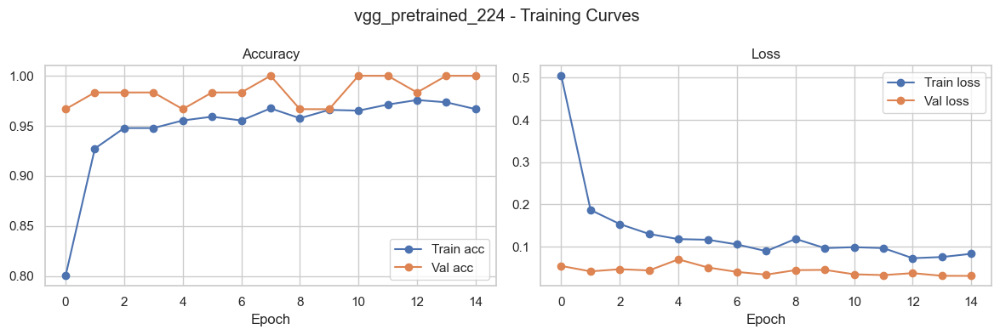


=== vgg_pretrained_224 ===
Test loss: 0.1705 | Test acc: 0.9600

              precision    recall  f1-score   support

     Healthy     0.9423    0.9800    0.9608        50
     Powdery     0.9792    0.9400    0.9592        50
        Rust     0.9600    0.9600    0.9600        50

    accuracy                         0.9600       150
   macro avg     0.9605    0.9600    0.9600       150
weighted avg     0.9605    0.9600    0.9600       150



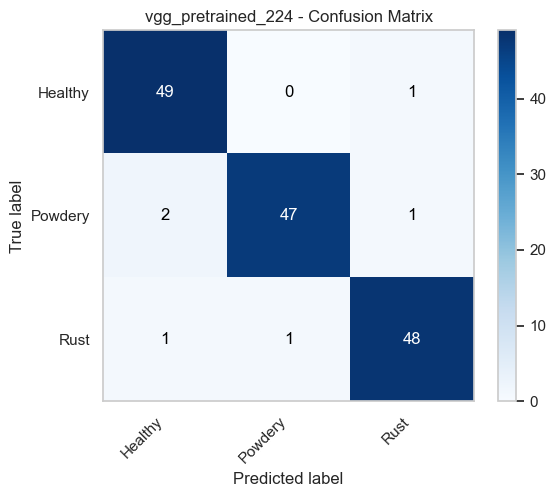

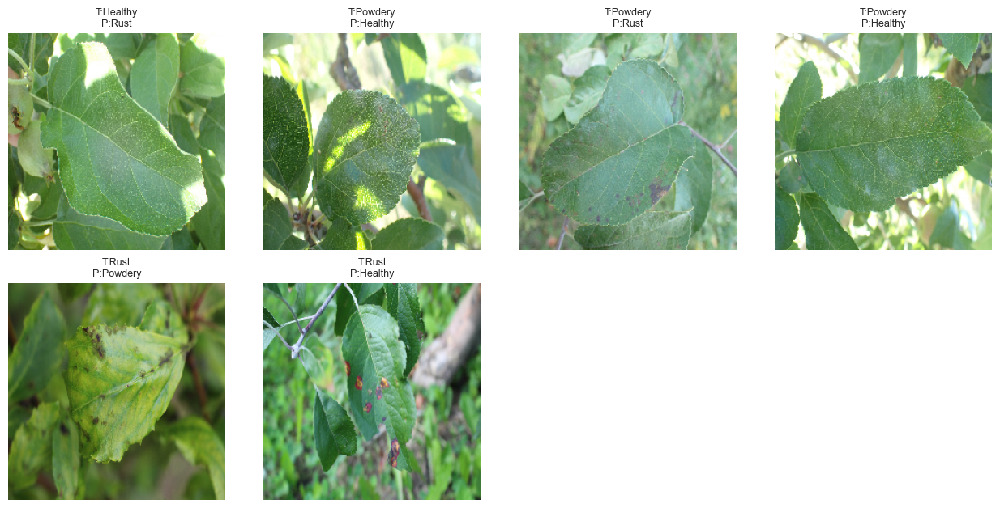

(0.1704559177160263, 0.9599999785423279)

In [7]:
import importlib, pretrained_vgg16_tl
importlib.reload(pretrained_vgg16_tl)

from pretrained_vgg16_tl import VGG16TLConfig, VGG16TransferLearningExperiment

exp = VGG16TransferLearningExperiment(dm224, VGG16TLConfig(retrain=True))
exp.train_or_load(train_ds, val_ds)
exp.plot_curves()
exp.evaluate_test(test_ds)


# VGG fine-tuned

In this cell, We      fine-tune the VGG model using a staged approach. We      first train with the backbone frozen, then unfreeze selected deeper layers and continue training with a smaller learning rate. The reason for doing it in stages is to keep training stable and avoid destroying useful pretrained features, which is especially important when the dataset is small.


[vgg_finetuned_224] Stage 1: frozen backbone (epochs=10, lr=0.001)
Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6675 - loss: 0.9348
Epoch 1: val_loss improved from None to 0.11400, saving model to models\vgg_finetuned_224\vgg_finetuned_224_stage1_best.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 221s 5s/step - accuracy: 0.8064 - loss: 0.5277 - val_accuracy: 0.9333 - val_loss: 0.1140 - learning_rate: 0.0010
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9396 - loss: 0.1663
Epoch 2: val_loss improved from 0.11400 to 0.05753, saving model to models\vgg_finetuned_224\vgg_finetuned_224_stage1_best.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 236s 6s/step - accuracy: 0.9380 - loss: 0.1683 - val_accuracy: 0.9667 - val_loss: 0.0575 - learning_rate: 0.0010
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9376 - loss: 0.1716
Epoch 3: val_loss did not improve from 0.05753
42/42 ━━━━━━━━━━━━━━━━━━━━ 226s 5s/step - accuracy: 0.9440 - loss: 0.1528 - val_accuracy: 0.9667 - val

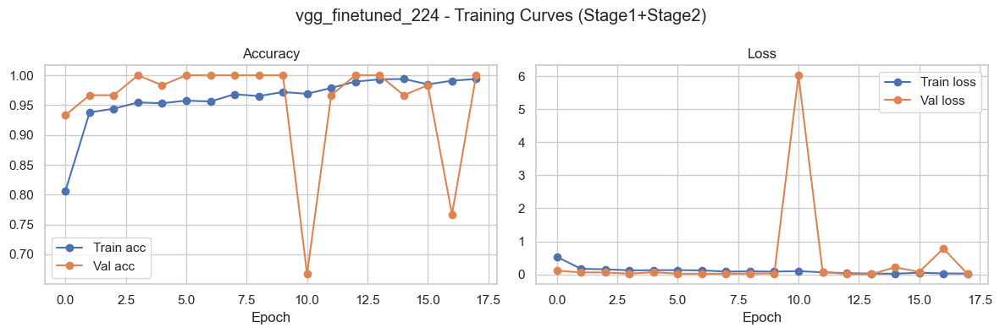


=== vgg_finetuned_224 ===
Test loss: 0.1526 | Test acc: 0.9800

              precision    recall  f1-score   support

     Healthy     0.9615    1.0000    0.9804        50
     Powdery     1.0000    0.9400    0.9691        50
        Rust     0.9804    1.0000    0.9901        50

    accuracy                         0.9800       150
   macro avg     0.9806    0.9800    0.9799       150
weighted avg     0.9806    0.9800    0.9799       150



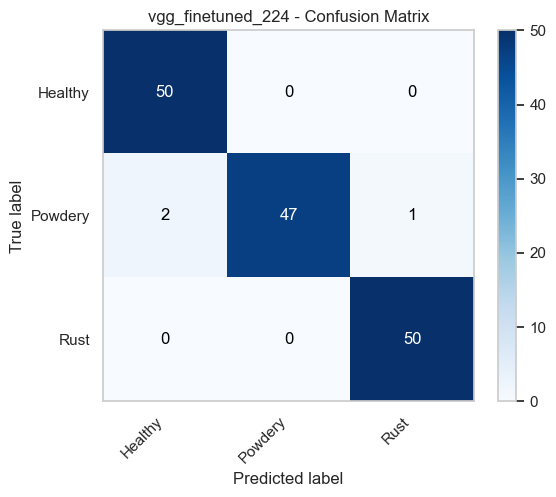

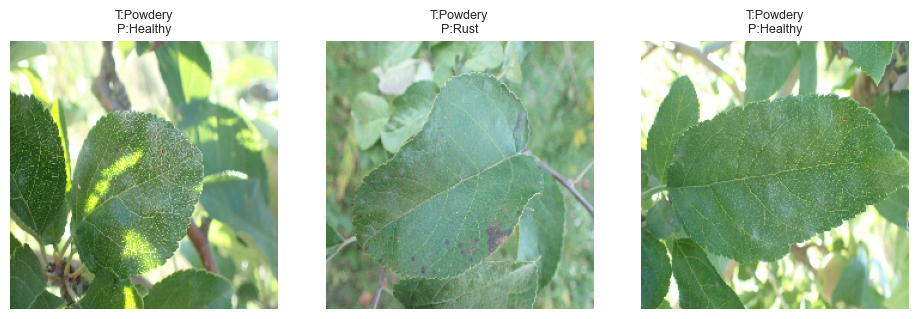

(0.1526487022638321, 0.9800000190734863)

In [6]:
import importlib, pretrained_vgg16_finetune
importlib.reload(pretrained_vgg16_finetune)

from pretrained_vgg16_finetune import VGG16FTConfig, VGG16FineTuneExperiment

exp = VGG16FineTuneExperiment(dm224, VGG16FTConfig(retrain=True))
exp.train_or_load(train_ds, val_ds)
exp.plot_curves()
exp.evaluate_test(test_ds)


# ResNet50 pretrained / frozen

In this cell, we run the ResNet50 transfer learning experiment using a frozen backbone. ResNet is interesting here because its residual connections make deep representations strong and stable, even when trained for many layers. In the frozen setting, we focus on whether ResNet’s pretrained features already separate Healthy, Powdery, and Rust well with only a trained classifier head.


[resnet_pretrained_224] Training ResNet50 TL (frozen backbone)...
Epoch 1/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8107 - loss: 0.4897
Epoch 1: val_loss improved from None to 0.06829, saving model to models\resnet_pretrained_224\resnet_pretrained_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.9047 - loss: 0.2604 - val_accuracy: 0.9833 - val_loss: 0.0683 - learning_rate: 0.0010
Epoch 2/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9699 - loss: 0.1008
Epoch 2: val_loss improved from 0.06829 to 0.04223, saving model to models\resnet_pretrained_224\resnet_pretrained_224.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9705 - loss: 0.0925 - val_accuracy: 1.0000 - val_loss: 0.0422 - learning_rate: 0.0010
Epoch 3/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9713 - loss: 0.1054
Epoch 3: val_loss did not improve from 0.04223
42/42 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.9766 - loss: 0.0858 - val_accuracy: 0.9833 - val_loss: 0.057

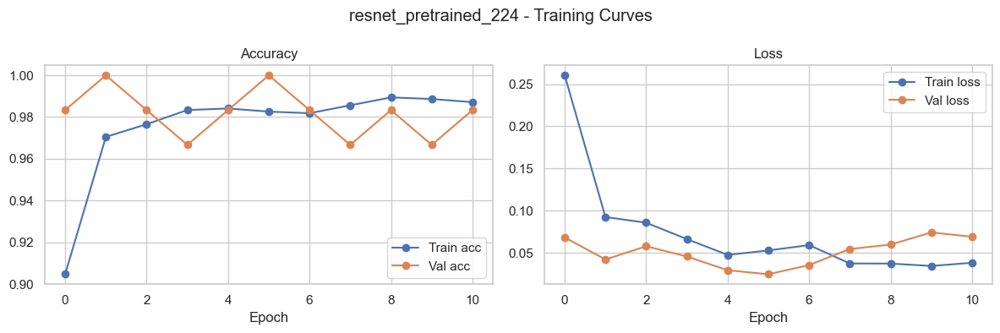


=== resnet_pretrained_224 ===
Test loss: 0.0759 | Test acc: 0.9467

              precision    recall  f1-score   support

     Healthy     0.9216    0.9400    0.9307        50
     Powdery     0.9592    0.9400    0.9495        50
        Rust     0.9600    0.9600    0.9600        50

    accuracy                         0.9467       150
   macro avg     0.9469    0.9467    0.9467       150
weighted avg     0.9469    0.9467    0.9467       150



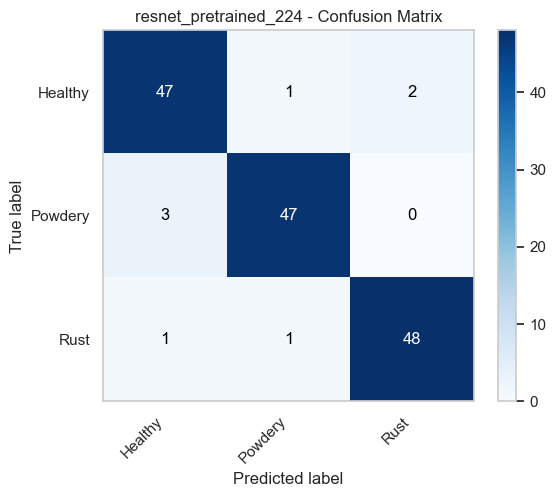

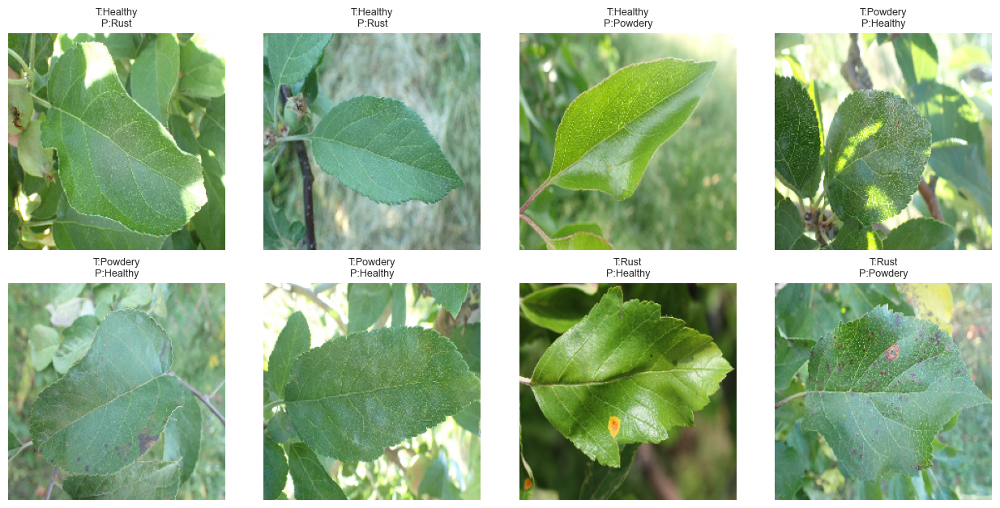

(0.07585370540618896, 0.9466666579246521)

In [7]:
import importlib, pretrained_resnet50_tl
importlib.reload(pretrained_resnet50_tl)

from pretrained_resnet50_tl import ResNet50TLConfig, ResNet50TransferLearningExperiment

exp = ResNet50TransferLearningExperiment(dm224, ResNet50TLConfig(retrain=True))
exp.train_or_load(train_ds, val_ds)
exp.plot_curves()
exp.evaluate_test(test_ds)


# ResNet50 fine-tuned

In this cell, we fine-tune the ResNet50 model in two stages to match a careful fine-tuning strategy. After training the head with the backbone frozen, we  unfreeze layers from a chosen boundary and continue training using a smaller learning rate. we also keep BatchNorm layers frozen to avoid unstable behavior on a small dataset. This experiment helps confirm whether controlled fine-tuning improves the class separation, especially for the difficult Healthy vs Powdery boundary.


[resnet_finetuned_224] Stage 1: frozen backbone (epochs=15, lr=0.001)
Epoch 1/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7842 - loss: 0.6060
Epoch 1: val_loss improved from None to 0.11176, saving model to models\resnet_finetuned_224\resnet_finetuned_224_stage1_best.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.8926 - loss: 0.3190 - val_accuracy: 0.9667 - val_loss: 0.1118 - learning_rate: 0.0010
Epoch 2/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9660 - loss: 0.0952
Epoch 2: val_loss improved from 0.11176 to 0.06758, saving model to models\resnet_finetuned_224\resnet_finetuned_224_stage1_best.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.9697 - loss: 0.0952 - val_accuracy: 0.9833 - val_loss: 0.0676 - learning_rate: 0.0010
Epoch 3/15
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9714 - loss: 0.0806
Epoch 3: val_loss did not improve from 0.06758
42/42 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - accuracy: 0.9705 - loss: 0.0877 - val_accuracy: 

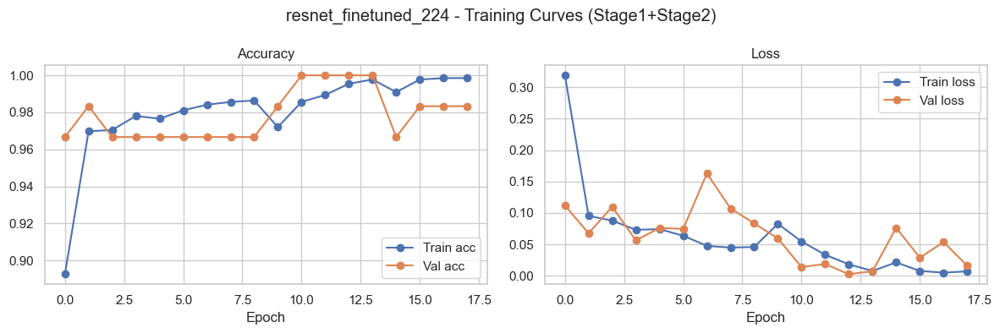


=== resnet_finetuned_224 ===
Test loss: 0.0689 | Test acc: 0.9800

              precision    recall  f1-score   support

     Healthy     0.9615    1.0000    0.9804        50
     Powdery     0.9796    0.9600    0.9697        50
        Rust     1.0000    0.9800    0.9899        50

    accuracy                         0.9800       150
   macro avg     0.9804    0.9800    0.9800       150
weighted avg     0.9804    0.9800    0.9800       150



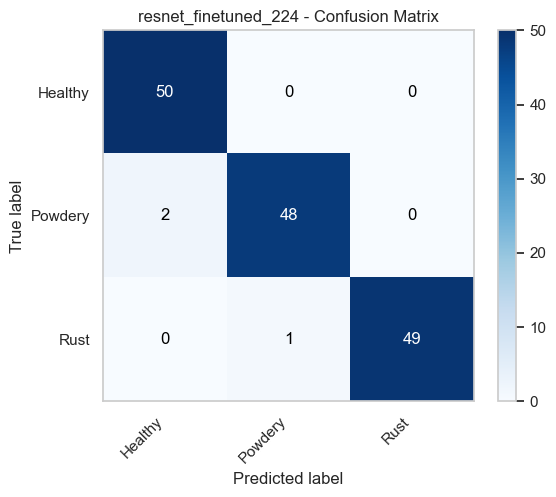

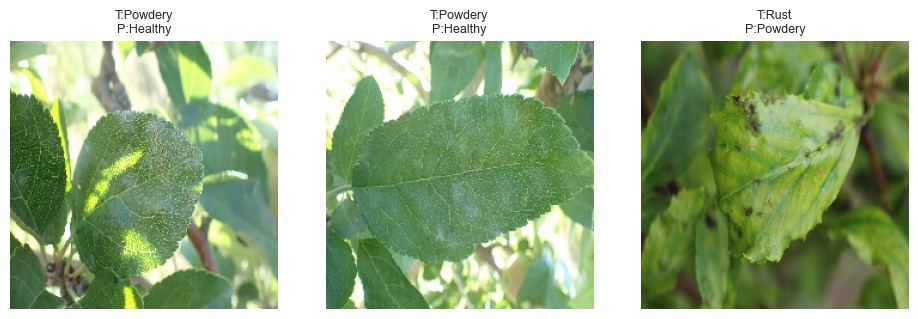

(0.06892293691635132, 0.9800000190734863)

In [8]:
import importlib, pretrained_resnet50_finetune
importlib.reload(pretrained_resnet50_finetune)

from pretrained_resnet50_finetune import ResNet50FTConfig, ResNet50FineTuneExperiment

exp = ResNet50FineTuneExperiment(dm224, ResNet50FTConfig(retrain=True))
exp.train_or_load(train_ds, val_ds)
exp.plot_curves()
exp.evaluate_test(test_ds)
